In [ ]:
!pip install roboflow ultralytics

from roboflow import Roboflow
rf = Roboflow(api_key="api_key")
project = rf.workspace("js-ozptv").project("foggy-car-ofcf4")
version = project.version(1)
dataset = version.download("yolo26")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.8/91.8 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 49.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 77.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 47.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 76.8 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.13.0.92
    Uninstalling opencv-python-headless-4.13.0.92:
      Successfully uninstalled opencv-python-headless-4.13.0.92
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to foggy-car-1 in yolo26:: 100%|██████████| 12911/12911 [00:01<00:00, 8879.24it/s]


In [2]:
print(dataset.location)

/content/foggy-car-1


In [3]:
DATASET_PATH = dataset.location

In [4]:
import os
from collections import defaultdict

def dataset_sanity_check(dataset_path, split="train"):
    images_dir = os.path.join(dataset_path, split, "images")
    labels_dir = os.path.join(dataset_path, split, "labels")

    image_files = set(os.listdir(images_dir))
    label_files = set(os.listdir(labels_dir))

    image_basenames = {os.path.splitext(f)[0] for f in image_files}
    label_basenames = {os.path.splitext(f)[0] for f in label_files}

    missing_labels = image_basenames - label_basenames
    orphan_labels = label_basenames - image_basenames

    empty_labels = []
    total_boxes = 0

    for lbl in label_files:
        with open(os.path.join(labels_dir, lbl)) as f:
            lines = f.readlines()
            if len(lines) == 0:
                empty_labels.append(lbl)
            total_boxes += len(lines)

    print(f" Split: {split}")
    print(f" Images: {len(image_files)}")
    print(f" Label files: {len(label_files)}")
    print(f" Total bounding boxes: {total_boxes}")
    print(f" Images without labels: {len(missing_labels)}")
    print(f" Orphan label files: {len(orphan_labels)}")
    print(f" Empty label files: {len(empty_labels)}")

    return {
        "missing_labels": missing_labels,
        "orphan_labels": orphan_labels,
        "empty_labels": empty_labels
    }


In [5]:
for split in ["train", "valid", "test"]:
    dataset_sanity_check(DATASET_PATH, split)


 Split: train
 Images: 4512
 Label files: 4512
 Total bounding boxes: 48038
 Images without labels: 0
 Orphan label files: 0
 Empty label files: 78
 Split: valid
 Images: 651
 Label files: 651
 Total bounding boxes: 6962
 Images without labels: 0
 Orphan label files: 0
 Empty label files: 11
 Split: test
 Images: 1287
 Label files: 1287
 Total bounding boxes: 13300
 Images without labels: 0
 Orphan label files: 0
 Empty label files: 30


In [6]:
import matplotlib.pyplot as plt

def class_distribution(dataset_path, split="train"):
    labels_dir = os.path.join(dataset_path, split, "labels")
    class_counts = defaultdict(int)

    for lbl in os.listdir(labels_dir):
        with open(os.path.join(labels_dir, lbl)) as f:
            for line in f:
                class_id = int(line.split()[0])
                class_counts[class_id] += 1

    return class_counts


def plot_class_distribution(class_counts, title):
    classes = list(class_counts.keys())
    counts = list(class_counts.values())

    plt.figure(figsize=(8, 4))
    plt.bar(classes, counts)
    plt.xlabel("Class ID")
    plt.ylabel("Number of Boxes")
    plt.title(title)
    plt.show()


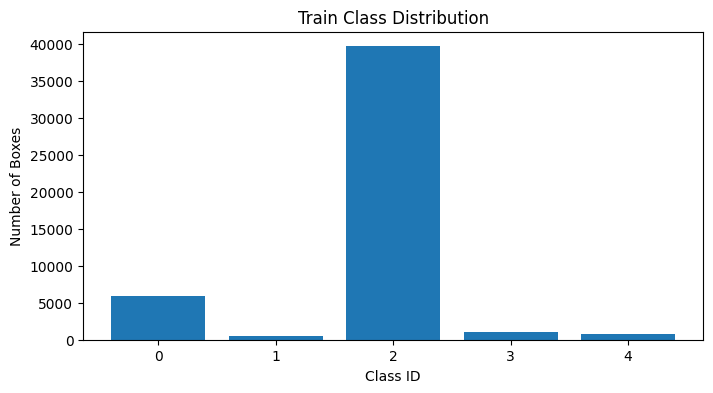

In [7]:
train_counts = class_distribution(DATASET_PATH, "train")
plot_class_distribution(train_counts, "Train Class Distribution")


In [8]:
import numpy as np

def bbox_statistics(dataset_path, split="train"):
    labels_dir = os.path.join(dataset_path, split, "labels")

    widths, heights, areas = [], [], []

    for lbl in os.listdir(labels_dir):
        with open(os.path.join(labels_dir, lbl)) as f:
            for line in f:
                _, _, _, w, h = map(float, line.split())
                widths.append(w)
                heights.append(h)
                areas.append(w * h)

    return np.array(widths), np.array(heights), np.array(areas)


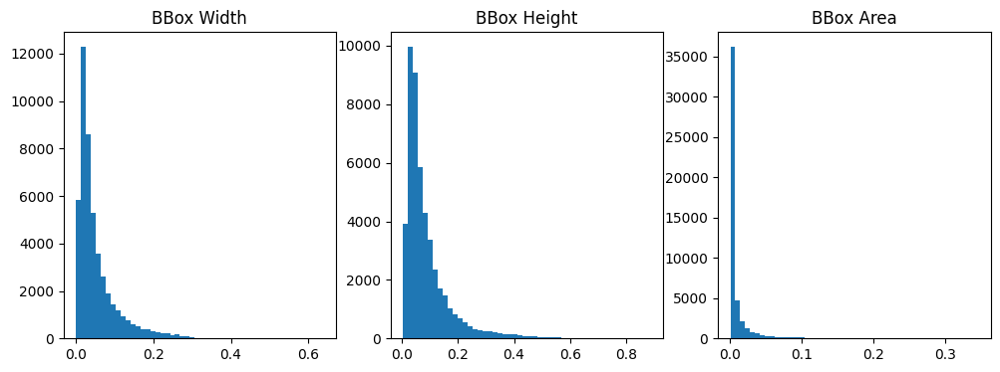

In [9]:
w, h, area = bbox_statistics(DATASET_PATH, "train")

plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.hist(w, bins=50)
plt.title("BBox Width")

plt.subplot(1,3,2)
plt.hist(h, bins=50)
plt.title("BBox Height")

plt.subplot(1,3,3)
plt.hist(area, bins=50)
plt.title("BBox Area")

plt.show()


In [10]:
def object_size_ratio(areas):
    small = np.sum(areas < 0.01)
    medium = np.sum((areas >= 0.01) & (areas < 0.05))
    large = np.sum(areas >= 0.05)

    total = len(areas)

    print(f"Small objects:  {small/total:.2%}")
    print(f"Medium objects: {medium/total:.2%}")
    print(f"Large objects:  {large/total:.2%}")


In [11]:
object_size_ratio(area)


Small objects:  81.01%
Medium objects: 15.03%
Large objects:  3.96%


In [12]:
import cv2
from tqdm import tqdm

def fog_contrast_scores(dataset_path, split="train", sample=300):
    images_dir = os.path.join(dataset_path, split, "images")
    scores = []

    for img_name in tqdm(os.listdir(images_dir)[:sample]):
        img = cv2.imread(os.path.join(images_dir, img_name), cv2.IMREAD_GRAYSCALE)
        if img is None:
            continue
        scores.append(img.std())  # lower std = heavier fog

    return scores


100%|██████████| 300/300 [00:00<00:00, 434.32it/s]


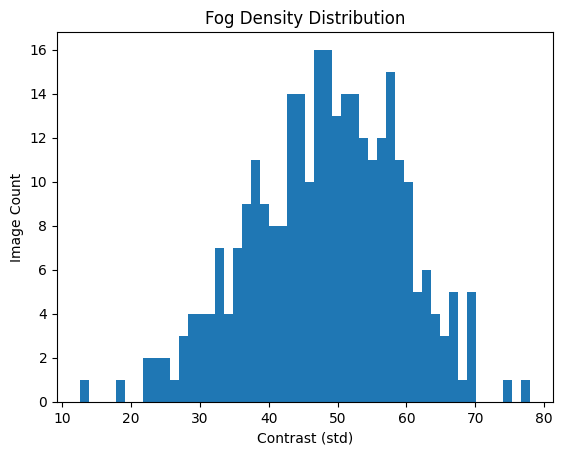

In [13]:
fog_scores = fog_contrast_scores(DATASET_PATH, "train")

plt.hist(fog_scores, bins=50)
plt.xlabel("Contrast (std)")
plt.ylabel("Image Count")
plt.title("Fog Density Distribution")
plt.show()


In [14]:
import os
import random
import matplotlib.pyplot as plt
import cv2
import numpy as np
import math


def draw_yolo_boxes(img, label_path, class_names=None):
    h, w = img.shape[:2]

    if not os.path.exists(label_path):
        return img

    with open(label_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        cls, xc, yc, bw, bh = map(float, line.split())

        # Convert normalized → pixel coords
        x1 = int((xc - bw / 2) * w)
        y1 = int((yc - bh / 2) * h)
        x2 = int((xc + bw / 2) * w)
        y2 = int((yc + bh / 2) * h)

        color = (0, 255, 0)  # green box
        cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)

        if class_names:
            label = class_names[int(cls)]
            cv2.putText(
                img,
                label,
                (x1, max(y1 - 5, 15)),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.6,
                color,
                2,
            )

    return img

def show_random_samples_with_boxes(
    dataset_path,
    split="train",
    n=5,
    class_names=None,
    cols=3  # 👈 number of images per row
):
    images_dir = os.path.join(dataset_path, split, "images")
    labels_dir = os.path.join(dataset_path, split, "labels")

    samples = random.sample(os.listdir(images_dir), n)

    rows = math.ceil(n / cols)

    # BIG figure size
    plt.figure(figsize=(6 * cols, 6 * rows))

    for i, img_name in enumerate(samples):
        img_path = os.path.join(images_dir, img_name)
        label_path = os.path.join(
            labels_dir,
            os.path.splitext(img_name)[0] + ".txt"
        )

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        img = draw_yolo_boxes(img, label_path, class_names)

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(img_name, fontsize=10)

    plt.tight_layout()
    plt.show()


In [15]:
import yaml

with open("/content/foggy-car-1/data.yaml") as f:
    data = yaml.safe_load(f)

class_names = data["names"]


In [16]:
class_names

['bicycle', 'bus', 'car', 'motorcycle', 'truck']

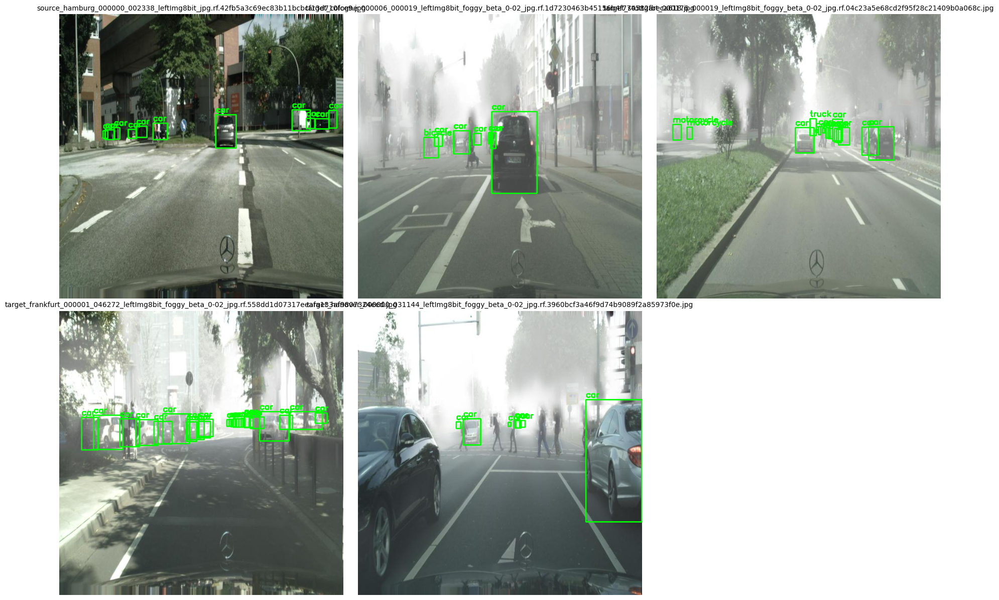

In [17]:
show_random_samples_with_boxes(
    DATASET_PATH,
    split="train",
    n=5,
    class_names=class_names
)


In [18]:
from ultralytics import YOLO
from ultralytics.data.dataset import YOLODataset
import ultralytics.data.build as build
import numpy as np
import matplotlib.pyplot as plt
import cv2

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [19]:
import os
import shutil

train_images = "/content/foggy-car-1/train/images"
train_labels = "/content/foggy-car-1/train/labels"

# bus and truck
target_classes = [1, 4]

duplicate_factor = 1  # 1 means duplicate once (2x total)

for label_file in os.listdir(train_labels):
    label_path = os.path.join(train_labels, label_file)

    with open(label_path, "r") as f:
        lines = f.readlines()

    contains_target = any(
        int(line.split()[0]) in target_classes
        for line in lines
    )

    if contains_target:
        image_file = label_file.replace(".txt", ".jpg")

        for i in range(duplicate_factor):
            new_image_name = image_file.replace(".jpg", f"_dup{i}.jpg")
            new_label_name = label_file.replace(".txt", f"_dup{i}.txt")

            shutil.copy(
                os.path.join(train_images, image_file),
                os.path.join(train_images, new_image_name)
            )
            shutil.copy(
                os.path.join(train_labels, label_file),
                os.path.join(train_labels, new_label_name)
            )

print("Duplication complete.")


Duplication complete.


In [20]:
class YOLOWeightedDataset(YOLODataset):
    def __init__(self, *args, mode="train", **kwargs):
        """
        Initialize the WeightedDataset.

        Args:
            class_weights (list or numpy array): A list or array of weights corresponding to each class.
        """

        super(YOLOWeightedDataset, self).__init__(*args, **kwargs)

        self.train_mode = "train" in self.prefix

        # You can also specify weights manually instead
        self.count_instances()
        class_weights = np.sum(self.counts) / self.counts
        self.agg_func = np.mean

        self.class_weights = np.array(class_weights)
        self.weights = self.calculate_weights()
        self.probabilities = self.calculate_probabilities()

    def count_instances(self):
        """
        Count the number of instances per class

        Returns:
            dict: A dict containing the counts for each class.
        """
        self.counts = [0 for i in range(len(self.data["names"]))]
        for label in self.labels:
            cls = label['cls'].reshape(-1).astype(int)
            for id in cls:
                self.counts[id] += 1

        self.counts = np.array(self.counts)
        self.counts = np.where(self.counts == 0, 1, self.counts)

    def calculate_weights(self):
        """
        Calculate the aggregated weight for each label based on class weights.

        Returns:
            list: A list of aggregated weights corresponding to each label.
        """
        weights = []
        for label in self.labels:
            cls = label['cls'].reshape(-1).astype(int)

            # Give a default weight to background class
            if cls.size == 0:
              weights.append(1)
              continue

            # Take mean of weights
            # You can change this weight aggregation function to aggregate weights differently
            # weight = np.mean(self.class_weights[cls])
            # weight = np.max(self.class_weights[cls])
            weight = self.agg_func(self.class_weights[cls])
            weights.append(weight)
        return weights

    def calculate_probabilities(self):
        """
        Calculate and store the sampling probabilities based on the weights.

        Returns:
            list: A list of sampling probabilities corresponding to each label.
        """
        total_weight = sum(self.weights)
        probabilities = [w / total_weight for w in self.weights]
        return probabilities

    def __getitem__(self, index):
        """
        Return transformed label information based on the sampled index.
        """
        # Don't use for validation
        if not self.train_mode:
            return self.transforms(self.get_image_and_label(index))
        else:
            index = np.random.choice(len(self.labels), p=self.probabilities)
            return self.transforms(self.get_image_and_label(index))

In [21]:
build.YOLODataset = YOLOWeightedDataset

In [22]:
import torch

#  Recommended for YOLO training
torch.backends.cuda.matmul.fp32_precision = "tf32"
torch.backends.cudnn.conv.fp32_precision = "tf32"

# Optional: enable cudnn benchmark for speed
torch.backends.cudnn.benchmark = True


In [23]:
model = YOLO("yolo26m.pt")

In [24]:
results = model.train(
    data="/content/foggy-car-1/data.yaml",
    epochs=120,
    imgsz=640,

    # Batch
    batch=96,  # Slightly lower than 128 for better gradient stability

    # Optimizer
    optimizer="SGD",          # More stable for detection
    lr0=0.01,                 # Proper SGD default
    lrf=0.1,                  # Higher final LR (less aggressive decay)
    momentum=0.937,
    weight_decay=5e-4,
    cos_lr=True,

    # Warmup
    warmup_epochs=5.0,        # Slightly longer warmup
    warmup_bias_lr=0.05,      # Lower than 0.1 for smoother start
    warmup_momentum=0.8,

    # Augmentations
    mosaic=1.0,
    close_mosaic=20,          # Disable earlier for stability
    copy_paste=0.1,           # Reduce from 0.2 (too aggressive)
    hsv_h=0.015,
    hsv_s=0.4,
    hsv_v=0.4,
    scale=0.5,
    translate=0.1,

    # Loss balancing (important for recall)
    box=9.0,                  # Increase box weight (better localization → better recall)
    cls=0.5,
    dfl=1.5,

    # Performance
    cache="disk",             # Avoid RAM nondeterminism
    amp=True,
    compile=True,
    pretrained=True,

    # Stability
    freeze=0,                 # Let backbone adapt to fog
    workers=8,
    patience=30,              # Give model more room
)


Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.9.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=96, bgr=0.0, box=9.0, cache=disk, cfg=None, classes=None, close_mosaic=20, cls=0.5, compile=True, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/foggy-car-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=120, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=0, half=False, hsv_h=0.015, hsv_s=0.4, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26m.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overlap_mask=True, patience=30, perspe

In [26]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [25]:
# plt.figure(figsize=(10,5))
# plt.plot(results['metrics/mAP50(B)'], label='mAP@50')
# plt.plot(results['metrics/mAP50-95(B)'], label='mAP@50-95')
# plt.xlabel("Epoch")
# plt.ylabel("mAP")
# plt.legend()
# plt.title("mAP over Epochs")
# plt.show()


TypeError: 'DetMetrics' object is not subscriptable

<Figure size 1000x500 with 0 Axes>

In [ ]:
# plt.figure(figsize=(10,5))
# plt.plot(results['train/box_loss'], label='Train Box Loss')
# plt.plot(results['val/box_loss'], label='Val Box Loss')
# plt.legend()
# plt.title("Box Loss")
# plt.show()


In [ ]:
# import pandas as pd
# import matplotlib.pyplot as plt

# # Load results
# results = pd.read_csv("runs/detect/train/results.csv")

# # Remove whitespace in column names (important)
# results.columns = results.columns.str.strip()

# # Plot Precision & Recall
# plt.figure(figsize=(10,5))
# plt.plot(results['metrics/precision(B)'], label='Precision')
# plt.plot(results['metrics/recall(B)'], label='Recall')
# plt.xlabel("Epoch")
# plt.ylabel("Score")
# plt.legend()
# plt.title("Precision vs Recall")
# plt.show()


In [27]:
!mkdir -p /content/drive/MyDrive/yolo_backup

!cp -r /content/foggy-car-1 /content/drive/MyDrive/yolo_backup/
!cp -r /content/runs /content/drive/MyDrive/yolo_backup/


In [28]:
!ls /content/drive/MyDrive/yolo_backup


foggy-car-1  runs


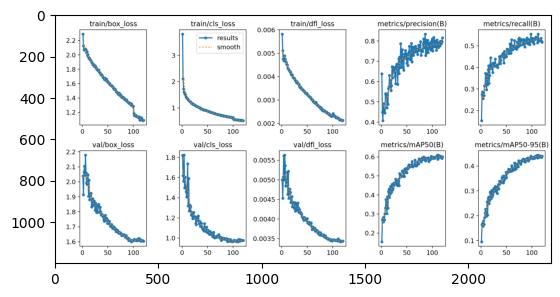

In [29]:
import matplotlib.pyplot as plt
from PIL import Image

img = Image.open("/content/runs/detect/train/results.png")
plt.imshow(img)
plt.show()

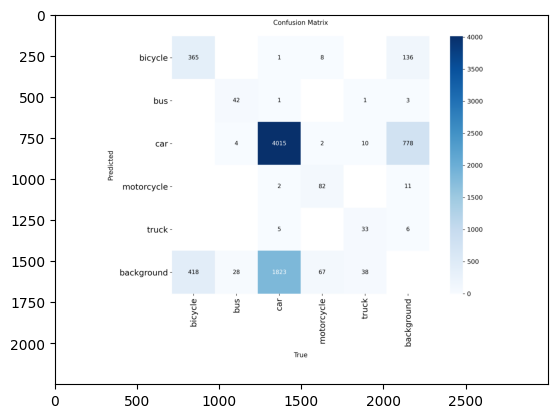

In [30]:
cm =  Image.open("/content/runs/detect/train/confusion_matrix.png")
plt.imshow(cm)
plt.show()

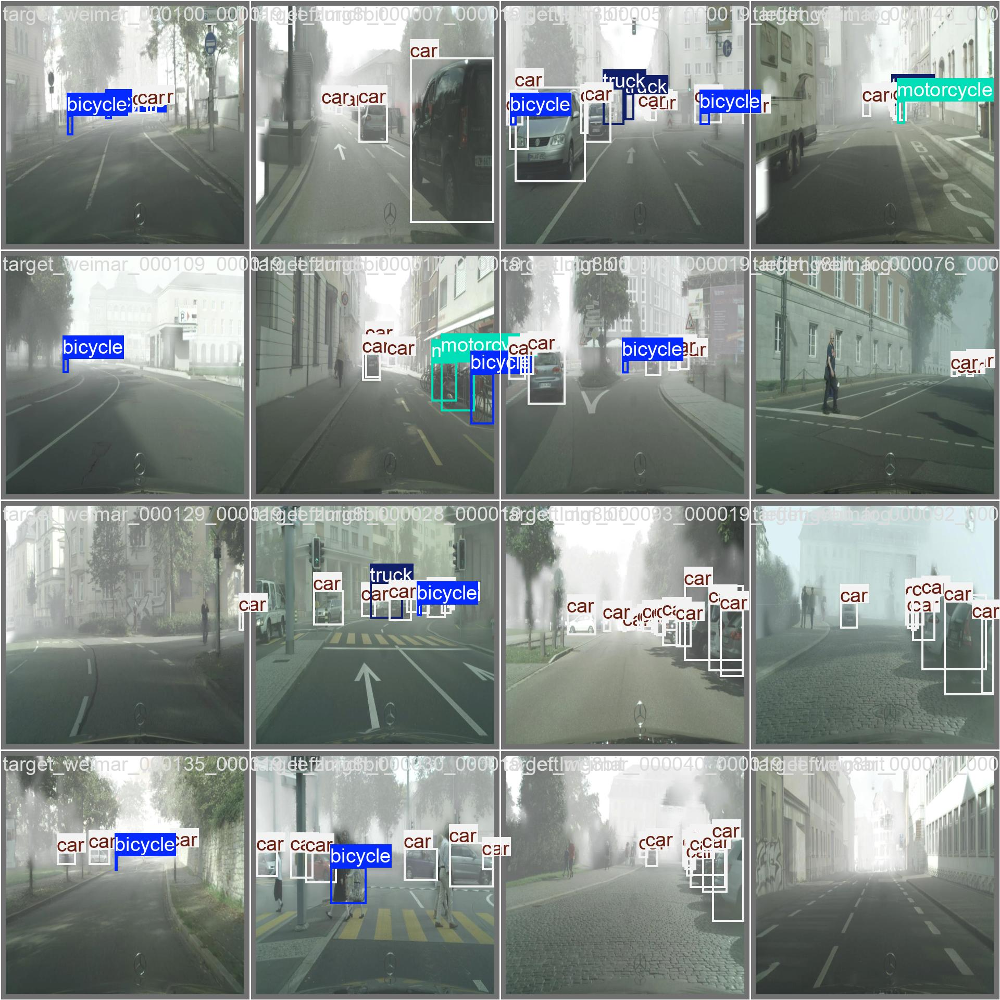

In [31]:
Image.open("/content/runs/detect/train/val_batch0_labels.jpg")

In [32]:
!ffmpeg -i /content/46_hazy_video.mp4 \
-vcodec libx264 -crf 28 -preset slow \
-acodec aac -b:a 128k \
/content/46_hazy_video_compressed.mp4


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [38]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train/weights/best.pt")

results = model.predict(
    source="/content/46_hazy_video_compressed.mp4",
    imgsz=640,
    conf=0.2,
    save=True,
    device=0
)



WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/272) /content/46_hazy_video_compressed.mp4: 384x640 6 cars, 1 motorcycle, 5116.3ms
video 1/1 (frame 2/272) /content/46_hazy_video_compressed.mp4: 384x640 6 cars, 1 motorcycle, 14.8ms
video 1/1 (frame 3/272) /content/46_hazy_video_compressed.mp4: 384x640 5 cars, 1 motorcycle, 17.2ms
video 1/1 (frame 4/272) /content/46_hazy_video_compressed.mp4: 384x640 5 cars, 1 motorcycle, 13.6ms
video 1/1 (frame 5/272) /content/46_hazy_video_compresse

In [39]:
!ls /content/runs/detect


predict  train


In [41]:
!ffmpeg -i /content/runs/detect/predict/46_hazy_video_compressed.avi \
-vcodec libx264 -crf 23 -preset fast \
/content/output_fixed.mp4


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [42]:
from IPython.display import Video
Video("/content/output_fixed.mp4", embed=True)


In [43]:
!mkdir -p /content/drive/MyDrive/yolo26_runs
!cp -r /content/runs /content/drive/MyDrive/yolo26_runs/


In [44]:
!rsync -av /content/runs /content/drive/MyDrive/yolo_backup/


sending incremental file list
runs/
runs/detect/
runs/detect/predict/
runs/detect/predict/46_hazy_video_compressed.avi
runs/detect/train/
runs/detect/train/BoxF1_curve.png
runs/detect/train/BoxPR_curve.png
runs/detect/train/BoxP_curve.png
runs/detect/train/BoxR_curve.png
runs/detect/train/args.yaml
runs/detect/train/confusion_matrix.png
runs/detect/train/confusion_matrix_normalized.png
runs/detect/train/labels.jpg
runs/detect/train/results.csv
runs/detect/train/results.png
runs/detect/train/train_batch0.jpg
runs/detect/train/train_batch1.jpg
runs/detect/train/train_batch2.jpg
runs/detect/train/train_batch5600.jpg
runs/detect/train/train_batch5601.jpg
runs/detect/train/train_batch5602.jpg
runs/detect/train/val_batch0_labels.jpg
runs/detect/train/val_batch0_pred.jpg
runs/detect/train/val_batch1_labels.jpg
runs/detect/train/val_batch1_pred.jpg
runs/detect/train/val_batch2_labels.jpg
runs/detect/train/val_batch2_pred.jpg
runs/detect/train/weights/
runs/detect/train/weights/best.pt
runs/det

In [49]:
!ls /content/drive/MyDrive/yolo_backup/foggy-car-1


data.yaml  README.roboflow.txt	test  train  valid


In [50]:
!ls /content/drive/MyDrive/yolo_backup/foggy-car-1/test


images	labels


In [51]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/yolo_backup/runs/detect/train/weights/best.pt")

results = model.predict(
    source="/content/drive/MyDrive/yolo_backup/foggy-car-1/test/images",
    imgsz=640,
    conf=0.2,
    save=True
)



WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1287 /content/drive/MyDrive/yolo_backup/foggy-car-1/test/images/source_aachen_000008_000019_leftImg8bit_jpg.rf.e65c53d512aab74b5e9ed555e1d70c65.jpg: 640x640 4 cars, 1 motorcycle, 14.1ms
image 2/1287 /content/drive/MyDrive/yolo_backup/foggy-car-1/test/images/source_aachen_000016_000019_leftImg8bit_jpg.rf.7acdee393005a23ca4c578645d4e4a0b.jpg: 640x640 1 bicycle, 3 cars, 1 motorcycle, 13.4ms
image 3/1287 /content/drive/MyDrive/yolo_backup/foggy-car-1

In [52]:
metrics = model.val(
    data="/content/drive/MyDrive/yolo_backup/foggy-car-1/data.yaml",
    split="test",
    imgsz=640
)


Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.9.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
val: Fast image access ✅ (ping: 0.6±0.4 ms, read: 13.2±9.2 MB/s, size: 32.0 KB)
val: Scanning /content/drive/MyDrive/yolo_backup/foggy-car-1/test/labels... 1287 images, 30 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1287/1287 120.4it/s 10.7s
val: /content/drive/MyDrive/yolo_backup/foggy-car-1/test/images/source_aachen_000060_000019_leftImg8bit_jpg.rf.0c1b83505d5d09052b7fcdb4566165af.jpg: 15 duplicate labels removed
val: /content/drive/MyDrive/yolo_backup/foggy-car-1/test/images/source_bremen_000241_000019_leftImg8bit_jpg.rf.13f499846c4204b30c9e29d0123f0090.jpg: 1 duplicate labels removed
val: /content/drive/MyDrive/yolo_backup/foggy-car-1/test/images/source_cologne_000006_000019_leftImg8bit_jpg.rf.b10966beb0b9bdc89714ee3f41e58845.jpg: 1 duplicate labels removed
val: /content/drive/MyDrive/yolo_backup/foggy-car-1/test/images/source_cologne_000009_000019_leftImg8bit_jpg.rf.b7ed2b403e29ec3f0204dc2

In [53]:
!zip -r predict_results.zip /content/runs/detect/predict


  adding: content/runs/detect/predict/ (stored 0%)
  adding: content/runs/detect/predict/source_strasbourg_000000_008784_leftImg8bit_jpg.rf.36ade997afbfe1de05f3931c97a78c7a.jpg (deflated 4%)
  adding: content/runs/detect/predict/target_erfurt_000025_000019_leftImg8bit_foggy_beta_0-02_jpg.rf.624a5f4f713b69ae6f7427f017520a41.jpg (deflated 7%)
  adding: content/runs/detect/predict/source_bremen_000076_000019_leftImg8bit_jpg.rf.50a04d3f67cca68375efdced8360b4ec.jpg (deflated 5%)
  adding: content/runs/detect/predict/source_krefeld_000000_008239_leftImg8bit_jpg.rf.a9f79a4185aba33bda7fc97e7ab0f84c.jpg (deflated 5%)
  adding: content/runs/detect/predict/source_strasbourg_000001_031683_leftImg8bit_jpg.rf.8696fffe74d3ae186cf5faf3caae3b1e.jpg (deflated 4%)
  adding: content/runs/detect/predict/target_cologne_000147_000019_leftImg8bit_foggy_beta_0-02_jpg.rf.d276e0ee4d4af21a14c9e5eeab10b33c.jpg (deflated 5%)
  adding: content/runs/detect/predict/target_frankfurt_000000_012121_leftImg8bit_foggy_beta

In [54]:
from google.colab import files
files.download("predict_results.zip")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [55]:
!zip -r val_results.zip /content/runs/detect/val


  adding: content/runs/detect/val/ (stored 0%)
  adding: content/runs/detect/val/confusion_matrix_normalized.png (deflated 21%)
  adding: content/runs/detect/val/val_batch1_pred.jpg (deflated 10%)
  adding: content/runs/detect/val/val_batch0_pred.jpg (deflated 10%)
  adding: content/runs/detect/val/val_batch1_labels.jpg (deflated 11%)
  adding: content/runs/detect/val/confusion_matrix.png (deflated 23%)
  adding: content/runs/detect/val/BoxF1_curve.png (deflated 9%)
  adding: content/runs/detect/val/val_batch0_labels.jpg (deflated 10%)
  adding: content/runs/detect/val/BoxPR_curve.png (deflated 9%)
  adding: content/runs/detect/val/BoxP_curve.png (deflated 9%)
  adding: content/runs/detect/val/BoxR_curve.png (deflated 10%)
  adding: content/runs/detect/val/val_batch2_labels.jpg (deflated 8%)
  adding: content/runs/detect/val/val_batch2_pred.jpg (deflated 8%)


In [56]:
from google.colab import files
files.download("val_results.zip")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>